In [1]:
# Kernel crashes on GPU here when using WSL so we force CPU only as GPU is not needed for this notebook
import os
os.environ['CUDA_VISIBLE_DEVICES'] = ''  # Forces TensorFlow to use CPU only

import tensorflow as tf
print("Available devices:")
print(tf.config.list_physical_devices())

2024-02-23 12:35:14.019184: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-02-23 12:35:17.430475: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-02-23 12:35:40.120698: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Available devices:
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]


2024-02-23 12:36:28.427275: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:268] failed call to cuInit: UNKNOWN ERROR (100)


In [2]:
#@title Imports. { vertical-output: true }
import json
from ml_collections import config_dict
import numpy as np
from etils import epath
import matplotlib.pyplot as plt

#from chirp.inference import colab_utils
#colab_utils.initialize(use_tf_gpu=True, disable_warnings=True)

from chirp import audio_utils
from chirp import path_utils
from chirp.inference import models
from chirp.projects.bootstrap import bootstrap
from chirp.projects.bootstrap import search
from chirp.projects.bootstrap import display

In [7]:
#@title Configuration and Setup. { vertical-output: true }
# Get base path
base_dir = os.getenv('BASE_DIR')
if not base_dir:
    raise ValueError("BASE_DIR environment variable is not set.")

# Path to embeddings of unlabeled data.
embeddings_path = os.path.join(base_dir, 'ucl_perch/data/australia/embeddings')  #@param

# Path for storing annotated examples.
labeled_data_path = os.path.join(base_dir, 'ucl_perch/data/australia/labels/meow/assisted_labels')  #@param

# Target label name
query_label = 'meow'  #@param

# Point to an audio file, Xeno-Canto id (like 'xc12345') or audio file URL.
audio_path = os.path.join(base_dir, 'ucl_perch/data/australia/labels/damselfish/starting_labels/damselfish_1.wav')  #@param

In [4]:
#@title Load Project State and Config. { vertical-output: true }

# Get relevant info from the embedding configuration.
embeddings_path = epath.Path(embeddings_path)
with (embeddings_path / 'config.json').open() as f:
  embedding_config = config_dict.ConfigDict(json.loads(f.read()))
embeddings_glob = embeddings_path / 'embeddings-*'

config = bootstrap.BootstrapConfig.load_from_embedding_config(
    embeddings_path=embeddings_path,
    annotated_path=labeled_data_path)

project_state = bootstrap.BootstrapState(config)

separator = None

In [5]:
#@title Load Separation Model (Optional) { vertical-output: true }
# We do not have a reef source separation model yet so set to None
separation_model_key = ''  #@param
separation_model_path = ''  #@param

if config.model_key == 'separate_embed_model' and not separation_model_key.strip():
  separation_model_key = 'separator_model_tf'
  separation_model_path = config.model_config.separator_model_tf_config.model_path


if separation_model_path:
  separation_config = config_dict.ConfigDict({
      'model_path': separation_model_path,
      'frame_size': 32000,
      'sample_rate': 32000,
  })
  separator = models.model_class_map()[
      separation_model_key].from_config(separation_config)
  print("Loaded separator model at {}".format(separation_model_path))
else:
  print('No separation model loaded.')
  separator = None

No separation model loaded.


## Query Creation

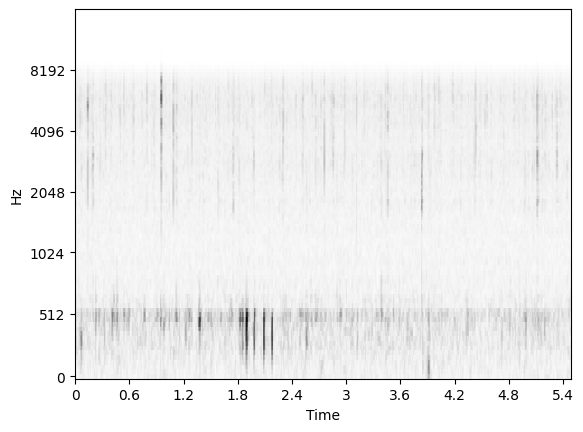

--------------------------------------------------------------------------------
Selected audio window:


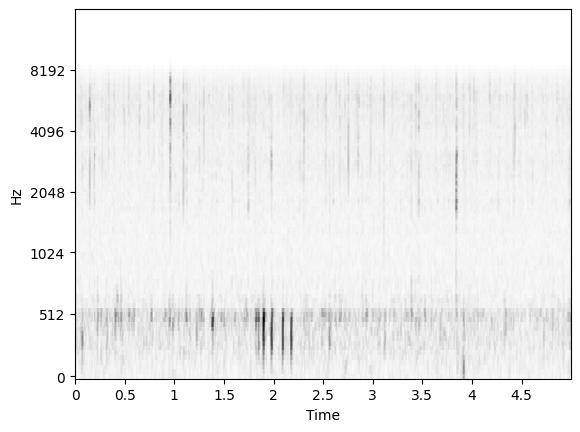

In [8]:
#@title Load query audio. { vertical-output: true }

# Muck around with manual selection of the query start time...
start_s = 0  #@param

window_s = config.model_config['window_size_s']
sample_rate = config.model_config['sample_rate']

# BOTTLENECK. When running on WSL, this line takes a long time to execute on first attempt. Subsequent runs are fast.
audio = audio_utils.load_audio(audio_path, sample_rate)

# Display the full file.
display.plot_audio_melspec(audio, sample_rate)

# Display the selected window.
print('-' * 80)
print('Selected audio window:')
st = int(start_s * sample_rate)
end = int(st + window_s * sample_rate)
if end > audio.shape[0]:
  end = audio.shape[0]
  st = max([0, int(end - window_s * sample_rate)])
audio_window = audio[st:end]
display.plot_audio_melspec(audio_window, sample_rate)

query_audio = audio_window
sep_outputs = None

In [53]:
#@title Separate the target audio window { vertical-output: true }

if separator is not None:
  sep_outputs = separator.embed(audio_window)

  for c in range(sep_outputs.separated_audio.shape[0]):
    print(f'Channel {c}')
    display.plot_audio_melspec(sep_outputs.separated_audio[c, :], sample_rate)
    print('-' * 80)
else:
  sep_outputs = None
  print('No separation model loaded.')

No separation model loaded.


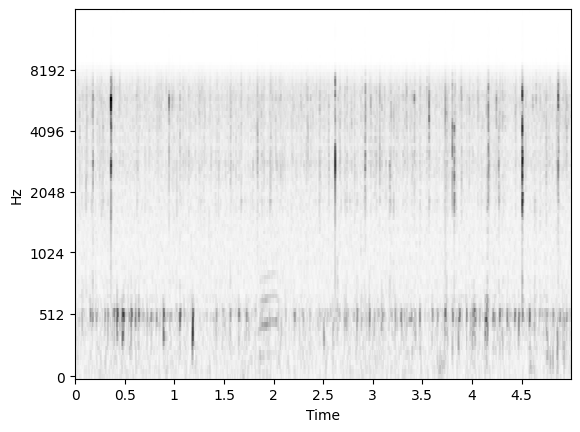

2024-02-14 13:54:18.931461: W tensorflow/compiler/tf2xla/kernels/assert_op.cc:38] Ignoring Assert operator jax2tf_infer_fn_/assert_equal_1/Assert/AssertGuard/Assert


In [54]:
#@title Select the query channel. { vertical-output: true }

query_channel = -1  #@param

if query_channel < 0 or sep_outputs is None:
  query_audio = audio_window
else:
  query_audio = sep_outputs.separated_audio[query_channel].copy()

display.plot_audio_melspec(query_audio, sample_rate)

outputs = project_state.embedding_model.embed(query_audio)
query = outputs.pooled_embeddings('first', 'first')


240it [00:00, 3946.57it/s]


score < target_score percentage : 0.001


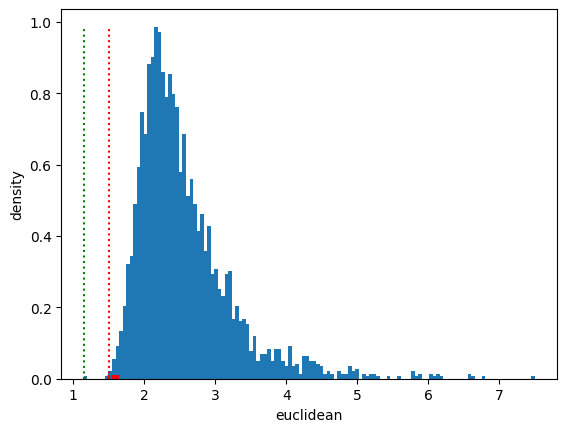

In [56]:
#@title Run Top-K Search. { vertical-output: true }

# Number of search results to capture.
top_k = 25  #@param

# Target distance for search results.
# This lets us try to hone in on a 'classifier boundary' instead of just
# looking at the closest matches.
# Set to 'None' for raw 'best results' search.
target_score = 1.5#None  #@param

metric = 'euclidean'  #@param['euclidean', 'mip', 'cosine']

random_sample = False  #@param

ds = project_state.create_embeddings_dataset()
results, all_scores = search.search_embeddings_parallel(
    ds, query,
    hop_size_s=config.embedding_hop_size_s,
    top_k=top_k, target_score=target_score, score_fn=metric,
    random_sample=random_sample)

# Plot histogram of distances
ys, _, _ = plt.hist(all_scores, bins=128, density=True)
hit_scores = [r.score for r in results.search_results]
plt.scatter(hit_scores, np.zeros_like(hit_scores), marker='|',
            color='r', alpha=0.5)

plt.xlabel(metric)
plt.ylabel('density')
if target_score is not None:
  plt.plot([target_score, target_score], [0.0, np.max(ys)], 'r:')
  # Compute the proportion of scores < target_score
  hit_percentage = (all_scores < target_score).mean()
  print(f'score < target_score percentage : {hit_percentage:5.3f}')
min_score = np.min(all_scores)
plt.plot([min_score, min_score], [0.0, np.max(ys)], 'g:')

plt.show()


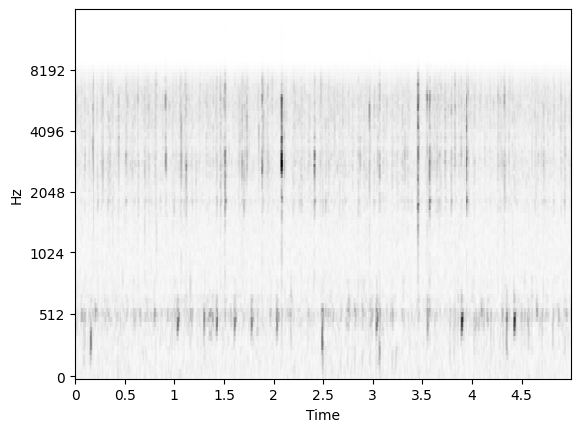

rank        : 0
source file : raw_audio/20230219_191600.WAV
offset_s    : 25.00
score       : 1.50


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


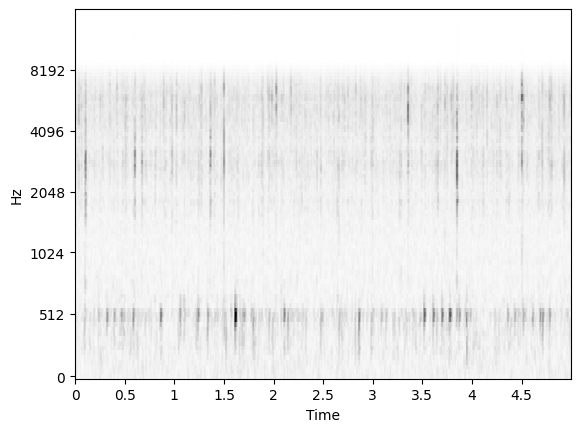

rank        : 1
source file : raw_audio/20230219_200000.WAV
offset_s    : 0.00
score       : 1.51


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


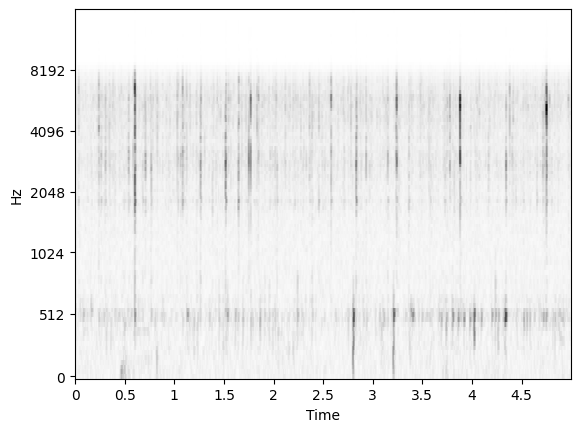

rank        : 2
source file : raw_audio/20230219_185600.WAV
offset_s    : 35.00
score       : 1.49


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


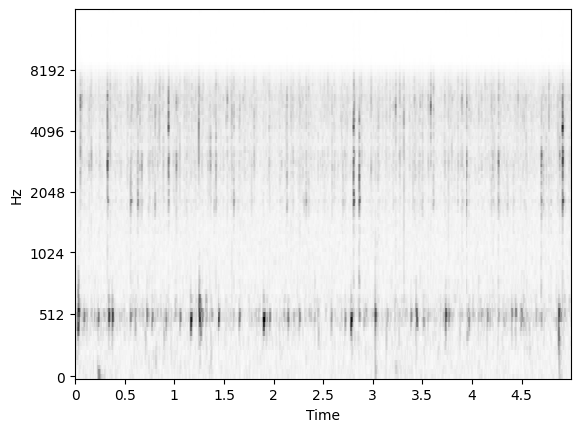

rank        : 3
source file : raw_audio/20230219_192000.WAV
offset_s    : 5.00
score       : 1.54


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


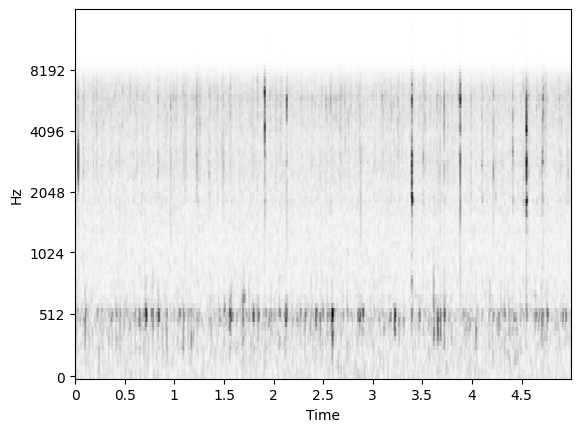

rank        : 4
source file : raw_audio/20230219_220400.WAV
offset_s    : 20.00
score       : 1.56


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


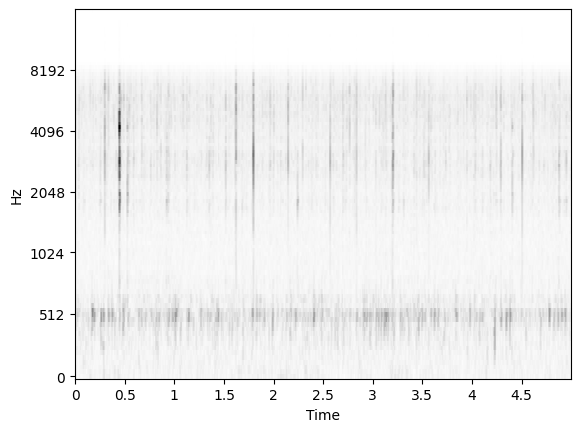

rank        : 5
source file : raw_audio/20230219_194800.WAV
offset_s    : 40.00
score       : 1.57


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


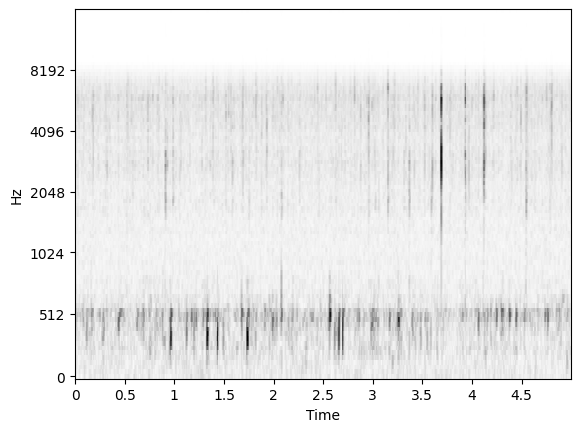

rank        : 6
source file : raw_audio/20230219_212800.WAV
offset_s    : 10.00
score       : 1.57


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


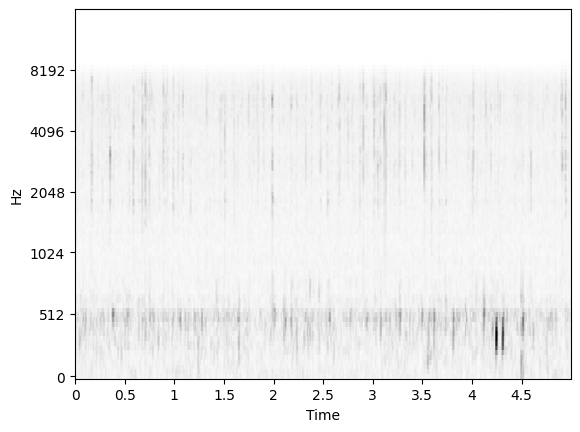

rank        : 7
source file : raw_audio/20230220_070800.WAV
offset_s    : 40.00
score       : 1.57


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


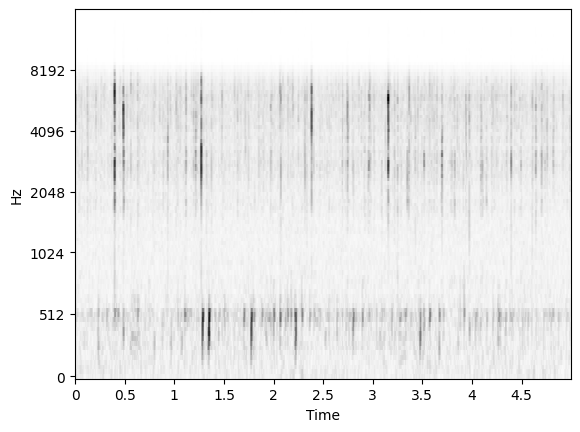

rank        : 8
source file : raw_audio/20230219_200800.WAV
offset_s    : 30.00
score       : 1.57


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


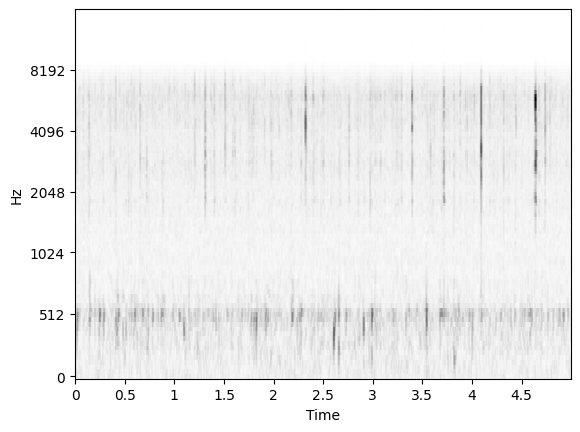

rank        : 9
source file : raw_audio/20230219_214800.WAV
offset_s    : 5.00
score       : 1.58


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


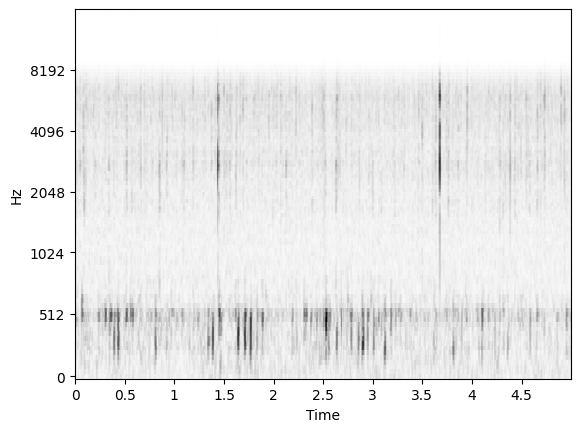

rank        : 10
source file : raw_audio/20230219_203600.WAV
offset_s    : 0.00
score       : 1.58


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


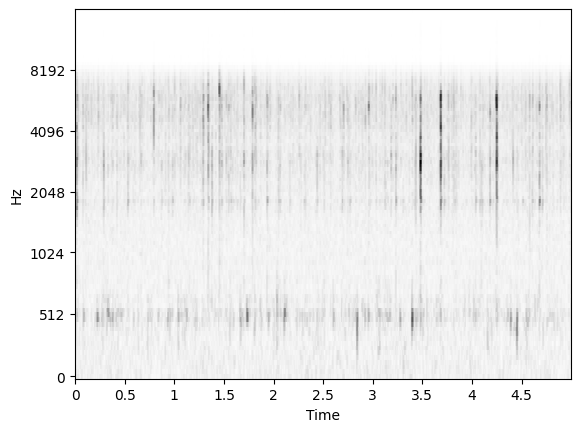

rank        : 11
source file : raw_audio/20230219_174400.WAV
offset_s    : 40.00
score       : 1.59


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


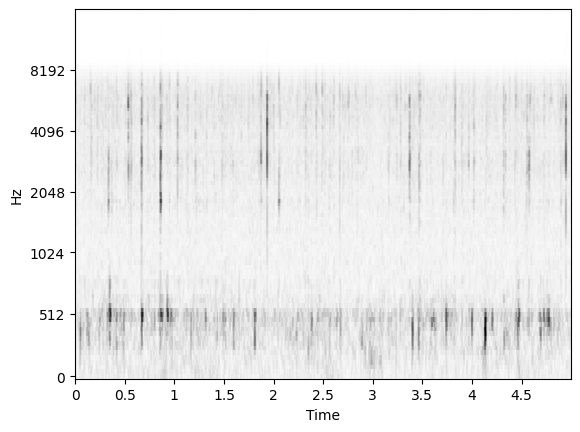

rank        : 12
source file : raw_audio/20230220_075600.WAV
offset_s    : 5.00
score       : 1.60


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


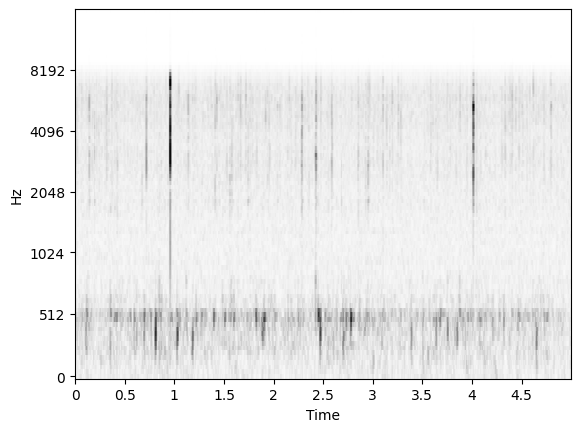

rank        : 13
source file : raw_audio/20230220_065600.WAV
offset_s    : 50.00
score       : 1.60


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


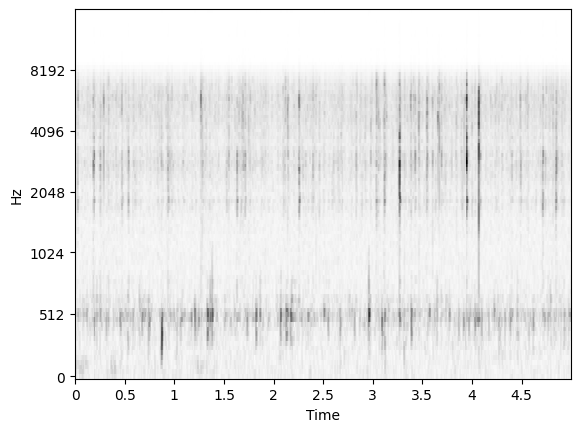

rank        : 14
source file : raw_audio/20230219_192400.WAV
offset_s    : 10.00
score       : 1.61


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


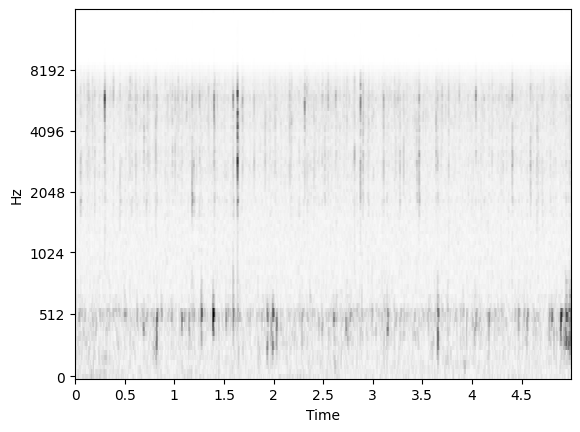

rank        : 15
source file : raw_audio/20230219_232000.WAV
offset_s    : 0.00
score       : 1.61


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


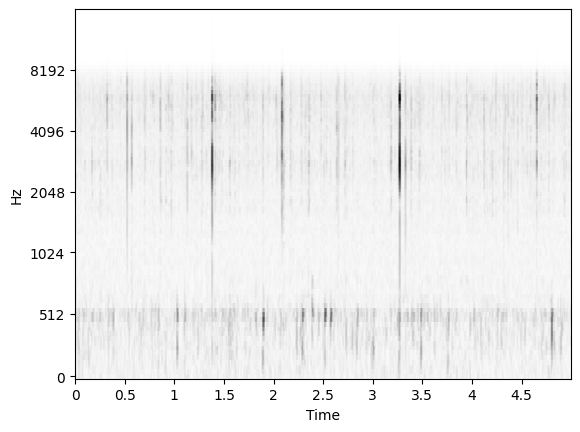

rank        : 16
source file : raw_audio/20230219_203600.WAV
offset_s    : 5.00
score       : 1.61


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


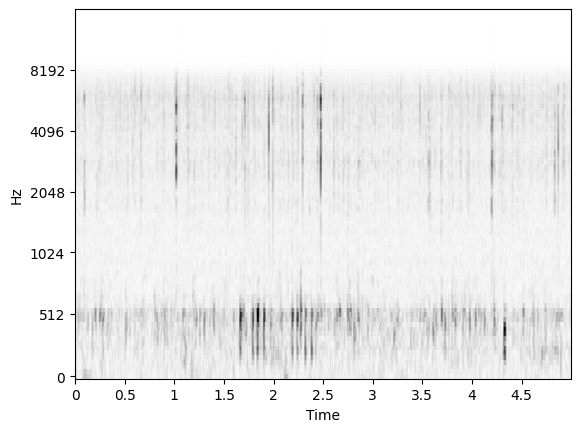

rank        : 17
source file : raw_audio/20230219_210800.WAV
offset_s    : 40.00
score       : 1.61


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


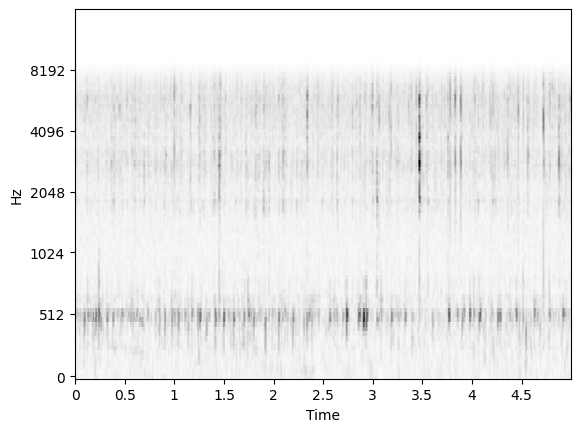

rank        : 18
source file : raw_audio/20230219_192400.WAV
offset_s    : 15.00
score       : 1.62


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


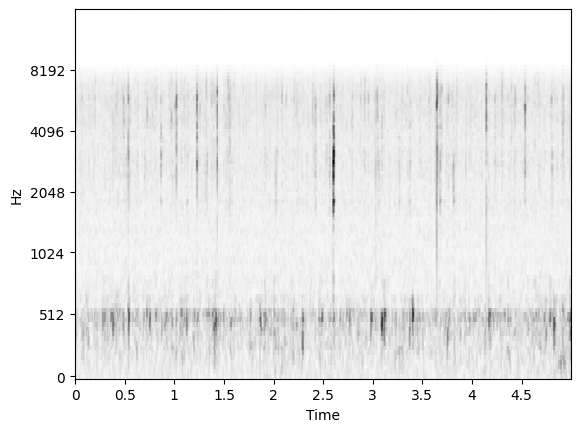

rank        : 19
source file : raw_audio/20230220_070400.WAV
offset_s    : 15.00
score       : 1.62


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


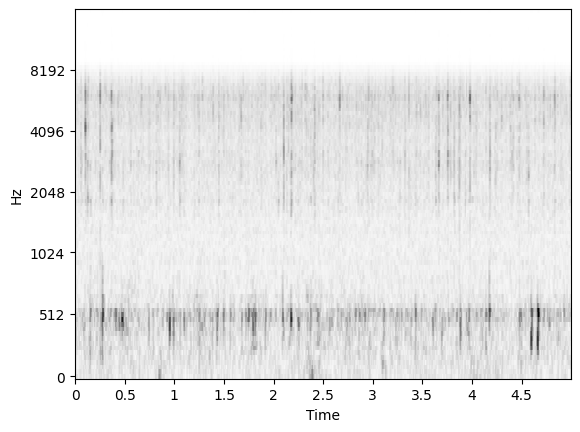

rank        : 20
source file : raw_audio/20230219_220000.WAV
offset_s    : 15.00
score       : 1.62


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


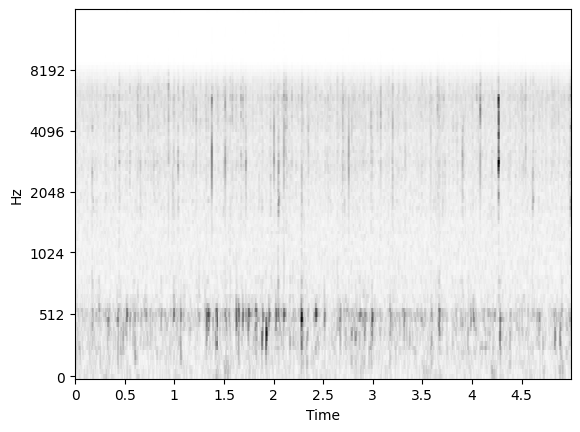

rank        : 21
source file : raw_audio/20230219_212000.WAV
offset_s    : 50.00
score       : 1.63


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


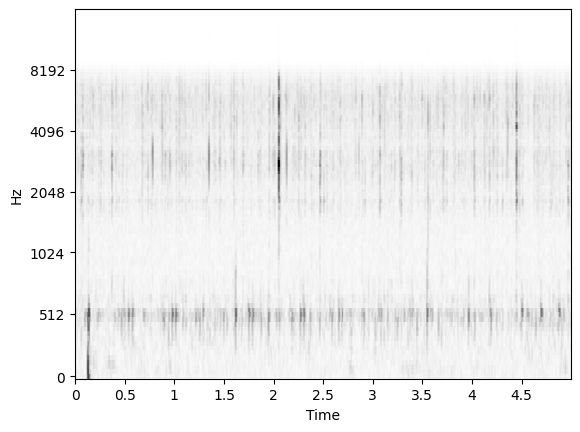

rank        : 22
source file : raw_audio/20230219_192400.WAV
offset_s    : 0.00
score       : 1.63


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


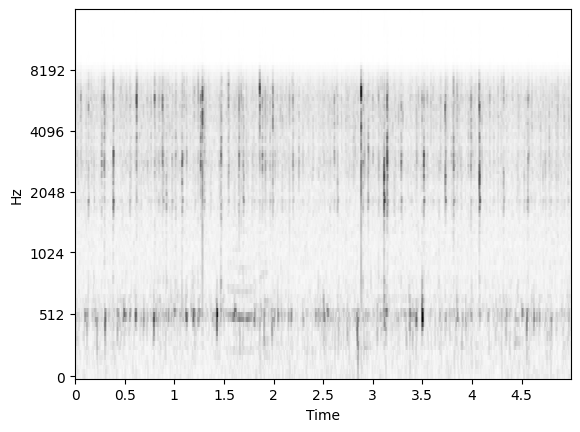

rank        : 23
source file : raw_audio/20230219_192000.WAV
offset_s    : 20.00
score       : 1.63


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


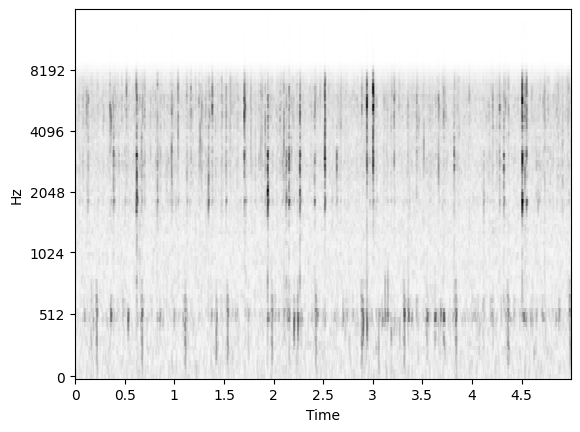

rank        : 24
source file : raw_audio/20230219_162800.WAV
offset_s    : 10.00
score       : 1.63


Button(description='meow', style=ButtonStyle())

Button(description='unknown', style=ButtonStyle())

--------------------------------------------------------------------------------


In [57]:
#@title Display results. { vertical-output: true }

display.display_search_results(
    results, sample_rate, project_state.source_map,
    checkbox_labels=[query_label, 'unknown'],
    max_workers=5)

In [59]:
#@title Write annotated examples. { vertical-output: true }

results.write_labeled_data(config.annotated_path,
                           project_state.embedding_model.sample_rate)

Wrote 24 examples for label unknown exists
Wrote 1 examples for label meow exists
